# end-to-end multi-class Dog breed classification project
this notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image to a dog.

when I'm sitting at the cafe and i take a photo of a dog, want to know what breed of dog it is.

## 2.Data

The data w'ere using is from kaggle's dog breed identification competition

https://www.kaggle.com/c/dog-bread-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/Transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels)
* There are around 10,000+ images in the best set (these images have no labels, because we'll want to predict them).




In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Get our workspace ready

In [ ]:
##!pip install --upgrade tensorflow

In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version",tf.__version__)
print("TF Hub version:",hub.__version__)

# Check fro GPU availability
print("GPU","available (YESSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version 2.8.2
TF Hub version: 0.12.0
GPU not available :(


## Getting our data ready (turning into Tensor)

with all machine learning models, our data has to be in numerical format.so that's what we'll be doing first.Turning our images into Tensore (numerical representation) .

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/projet/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


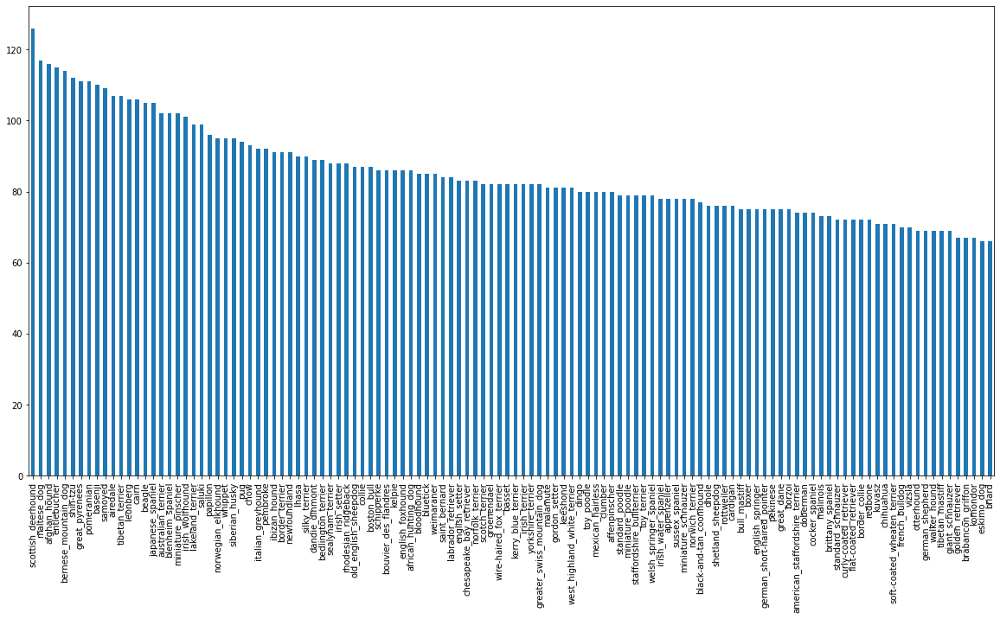

In [ ]:
# How many labels images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

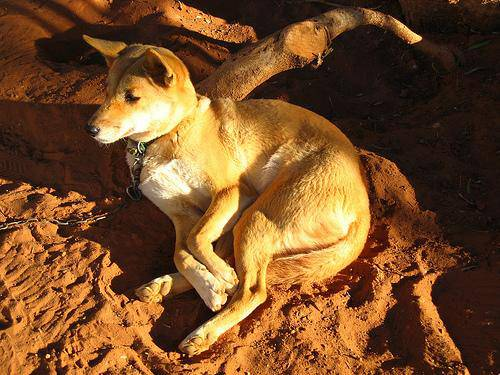

In [ ]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/projet/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and theire labels

Let's get a list of all of our image file pathnames


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathname from image IS's
filenames = ["/content/drive/MyDrive/projet/train/" +fname+ ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['/content/drive/MyDrive/projet/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/projet/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/projet/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/projet/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/projet/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/projet/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/projet/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/projet/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/projet/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/projet/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir("/content/drive/MyDrive/projet/train/")[:10]

['dd9aae7acb992593e07aa905ff4e5ca4.jpg',
 'e0fd9680fc1183c6c2de18e711192fe5.jpg',
 'dbb75e40f88b9703dbfe196f6ec57b3b.jpg',
 'e5064451d5ce1b406452427679281bbc.jpg',
 'e12986379661597e7c287008c89f4ea6.jpg',
 'dc3d4d214533950f6465ec2483af39c0.jpg',
 'e1b04d497388246d0305c01f8d01fa1a.jpg',
 'e189ef4583d4b2187abaa63f9a4fbd81.jpg',
 'e401d9046968cb01f5bdb97f92e61428.jpg',
 'decaf524b73836c58c7eb371cce2b980.jpg']

In [ ]:
# Check whether number of filenames matches number of actuel image files
if len(os.listdir("/content/drive/MyDrive/projet/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! proceed.


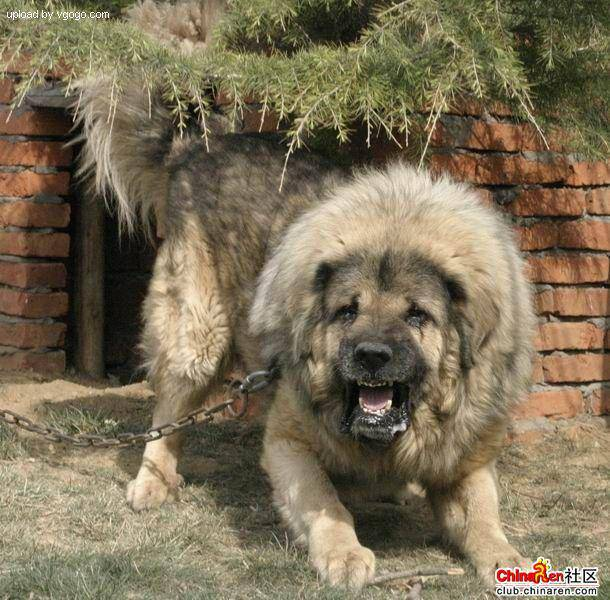

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list,let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels) # does same thing as above
labels 

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filnames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
    print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int))  # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
filenames[:10]

['/content/drive/MyDrive/projet/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/projet/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/projet/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/projet/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/projet/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/projet/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/projet/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/projet/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/projet/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/projet/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from kaggel dosn't come with a validation set, we're going to create our own

In [ ]:
# Setup X & Y variables
X = filenames
y = boolean_labels

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int))  # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
len(filenames)

10222

 We're going to start off experimenting -1000 images and increase as needed.

In [ ]:
# Set number of images to use for expermenting
NUM_IMAGES = 1000 #@param {type:"slider",min:1000, max:10000,step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:5]

(['/content/drive/MyDrive/projet/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/projet/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/projet/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/projet/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/projet/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, Fal

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image` 
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a snape of (224,224)
6. Return the modified `image`

Before we do,let's see what importing an image looks like

In [ ]:
# Convert image to Numpy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

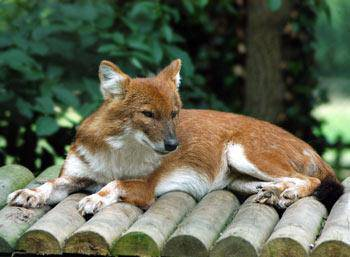

In [ ]:
Image(filenames[42])

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now e've seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image` 
3. Turn our `image` (a jpg) into tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a snape of (224,224)
6. Return the modified `image`

In [ ]:
# Define image size 
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  #Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to our value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])

  return image


## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be). 

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.



In [ ]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label 

In [ ]:
# Demo of the above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors
in the form: (`image`,`label`), let's make a function a turn all of our data (`x` & `y`)
into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE=32

# Create a function to turn data into batches
def create_data_batches(X,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles tha data if it's a training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training batches ...")
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before maping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image,label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
# Create raining and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)


Creating training batches ...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend.let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for vieweng imaeges in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Detup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25(for displaying 25 images)
  for i in range (25):
    # Create subplots (5rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[4.25622016e-01, 5.00131786e-01, 4.92288679e-01],
          [3.99485677e-01, 4.73995477e-01, 4.66152340e-01],
          [3.90442371e-01, 4.64952171e-01, 4.57109034e-01],
          ...,
          [4.61384207e-01, 5.35894036e-01, 5.28050900e-01],
          [4.24231172e-01, 5.03257811e-01, 5.08369923e-01],
          [4.44092065e-01, 5.26444972e-01, 5.38209677e-01]],
 
         [[3.99668097e-01, 4.74177897e-01, 4.66334760e-01],
          [4.08795208e-01, 4.83305007e-01, 4.75461870e-01],
          [4.15243387e-01, 4.89753187e-01, 4.81910050e-01],
          ...,
          [3.75743866e-01, 4.50253695e-01, 4.42410558e-01],
          [4.07628536e-01, 4.86655176e-01, 4.91767287e-01],
          [3.98696423e-01, 4.81049359e-01, 4.92814064e-01]],
 
         [[4.22365218e-01, 4.96875018e-01, 4.89031881e-01],
          [4.26323533e-01, 5.00833333e-01, 4.92990196e-01],
          [4.06392992e-01, 4.80902791e-01, 4.73059654e-01],
          ...,
          [4.33814794e-01, 5.08324564e-01, 5.0048

In [ ]:
len(train_images), len(train_labels)

(32, 32)

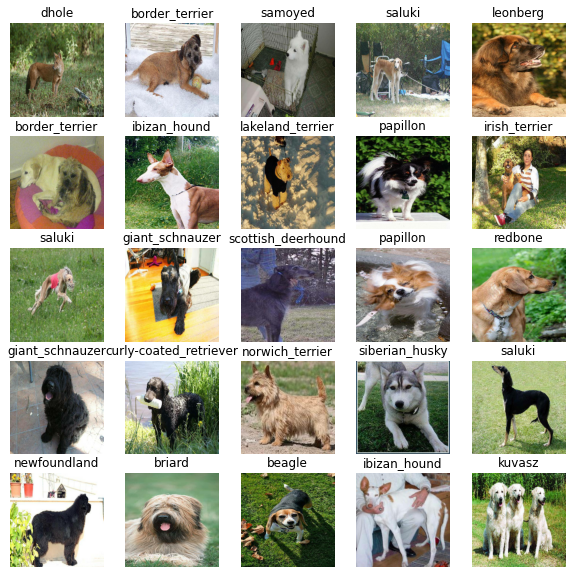

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

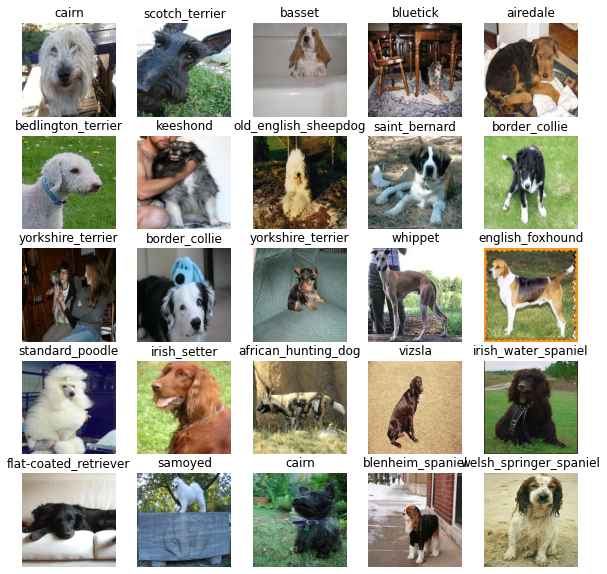

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

 ## Building a model

 Before we build a model, there are few things we need to define:
 * The input shape (our images shape, in the form of Tensors) to our model.
 * The output shape (image labels, in the form of Tensors) of our model.
 * The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE,IMG_SIZE,3] # batch,heigth, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and modek ready to go.
Let's put them together into a keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape,output shape and the model we've chosen as parameters.
* Defines the layers in a keras model in sequential fashion (do this first, then this , then that).
* Compiles the model (says it should be evaluated and improved).
* Build the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/api_docs/python/tf/keras

In [ ]:
# Create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shapr=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with",MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                      activation="softmax") # Layer 2 (output layer)

  ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
 outputs = np.ones(shape=(1,1,1280))
 outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress  or stop training early if a model stop improving.

We'll create two callbacks, one for TensoeBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

In [ ]:
# Load Tensorboard noteboard extension 
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops imporoving.  

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)


## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU","available (YESSS!!!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU not available :(


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained cersion.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 54s 2s/step - loss: 4.4269 - accuracy: 0.1025 - val_loss: 3.3354 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 41s 2s/step - loss: 1.5470 - accuracy: 0.7038 - val_loss: 2.1311 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 41s 2s/step - loss: 0.5499 - accuracy: 0.9388 - val_loss: 1.6580 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 41s 2s/step - loss: 0.2452 - accuracy: 0.9875 - val_loss: 1.4997 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 41s 2s/step - loss: 0.1449 - accuracy: 0.9975 - val_loss: 1.4206 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 41s 2s/step - loss: 0.0993 - accuracy: 0.9987 - val_loss: 1.3658 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 38s 2s/st

**Question:** it looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 9s 1s/step


array([[3.8982432e-03, 2.1166993e-04, 1.1374599e-03, ..., 1.7253647e-04,
        1.0950342e-05, 5.2072690e-03],
       [8.0305617e-04, 5.2487210e-04, 6.9098626e-03, ..., 9.1462352e-05,
        1.1885040e-03, 1.1450132e-04],
       [1.7629064e-06, 1.4259369e-05, 2.3772595e-06, ..., 6.6105342e-05,
        3.0544566e-06, 3.9199696e-04],
       ...,
       [1.6769412e-06, 1.0925963e-05, 2.3338947e-05, ..., 8.7751805e-06,
        1.8275074e-04, 9.7387056e-05],
       [2.5930598e-03, 1.1451398e-04, 9.1463568e-05, ..., 4.2004580e-05,
        1.8842957e-05, 8.5141050e-04],
       [3.5273060e-04, 5.5690169e-05, 4.0015724e-04, ..., 6.1765029e-03,
        7.0159457e-04, 2.6276235e-05]], dtype=float32)

In [ ]:
predictions[0]

array([3.89824319e-03, 2.11669932e-04, 1.13745988e-03, 1.41105964e-04,
       2.62451300e-04, 4.50194493e-05, 1.99683215e-02, 4.84801130e-04,
       9.30138413e-05, 4.57021175e-03, 2.76650011e-04, 2.02336436e-04,
       5.55014180e-04, 1.88642894e-04, 2.78649415e-04, 1.63523044e-04,
       1.11748996e-04, 1.44503459e-01, 5.99968553e-06, 2.32478065e-04,
       3.76109791e-04, 7.48392835e-04, 2.59884782e-05, 7.08982209e-03,
       2.33321625e-05, 4.80502495e-04, 1.31156474e-01, 1.59816016e-04,
       4.85639612e-04, 3.43048596e-04, 1.33207461e-04, 2.79632793e-03,
       4.74967645e-04, 7.70858533e-05, 1.44762700e-04, 1.08379712e-02,
       3.33458156e-05, 3.59604746e-04, 4.16132425e-05, 2.17196438e-03,
       1.24342635e-03, 1.63099885e-05, 1.23396647e-04, 3.31088842e-04,
       2.07636949e-05, 2.56449624e-04, 3.54883814e-05, 1.47009705e-04,
       2.74862652e-03, 2.27605487e-04, 3.73464514e-04, 2.02138235e-05,
       1.17907941e-03, 3.46606721e-05, 3.13316486e-05, 5.31510523e-05,
      

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.2093270e-04 7.2448325e-05 1.0523355e-05 1.1565716e-05 2.0287454e-03
 2.3078891e-04 2.0516712e-04 1.8675602e-03 5.8898591e-03 7.3594488e-02
 7.4359879e-05 2.1785134e-05 1.3533387e-03 2.3842922e-03 3.7828430e-03
 7.5073750e-03 3.1588726e-05 3.0981883e-04 4.7856065e-05 1.5244000e-04
 5.5778924e-05 3.7837593e-04 2.7010148e-05 2.2519300e-04 6.1721220e-03
 6.9534210e-05 5.3797557e-05 1.0348115e-04 1.9202024e-03 4.8629860e-05
 7.9101570e-05 7.1920804e-05 5.8695012e-05 3.2446413e-05 2.6499727e-05
 8.6746550e-06 8.0353828e-05 2.0346491e-04 3.5976715e-05 2.7970761e-01
 4.7275372e-04 5.9716886e-06 1.2382914e-02 2.2794162e-05 1.0924932e-04
 1.8170422e-05 1.4293969e-04 1.4471423e-03 4.5521221e-05 5.5713241e-04
 3.9033028e-05 3.4433702e-04 5.9912860e-04 2.0925978e-03 9.5386549e-06
 3.0055028e-04 4.0364273e-05 3.0809337e-05 4.7953970e-05 1.3977232e-05
 1.8391597e-04 2.1947004e-04 5.1083675e-06 1.9151001e-05 9.5147741e-05
 2.0813129e-04 4.3146989e-05 4.4367200e-04 5.5393088e-04 2.2203283e-05
 2.622

In [ ]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Predivtion probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their repective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset,we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels).

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset 
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images=[]
  labels=[]
  # Loop through unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[1],val_labels[1]

(array([[[0.96018916, 0.97587544, 0.979797  ],
         [0.9617217 , 0.977408  , 0.98132956],
         [0.9651424 , 0.9808287 , 0.9847503 ],
         ...,
         [0.95294124, 0.9725491 , 0.9960785 ],
         [0.94906336, 0.9686712 , 0.9922006 ],
         [0.94802153, 0.9676294 , 0.9911588 ]],
 
        [[0.97587544, 0.9915617 , 0.9954833 ],
         [0.9765078 , 0.99219406, 0.9961156 ],
         [0.9802049 , 0.99589115, 0.99981266],
         ...,
         [0.96018916, 0.979797  , 1.        ],
         [0.9563113 , 0.9759191 , 0.9994114 ],
         [0.95366776, 0.9732756 , 0.99680495]],
 
        [[0.9686275 , 0.9843138 , 0.98823535],
         [0.9689829 , 0.98466915, 0.9885907 ],
         [0.972765  , 0.9884513 , 0.9923729 ],
         ...,
         [0.9677083 , 0.98731613, 1.        ],
         [0.9650211 , 0.9846289 , 1.        ],
         [0.9610995 , 0.98070735, 0.9960785 ]],
 
        ...,
 
        [[0.29487073, 0.40404442, 0.24774945],
         [0.1316065 , 0.22889124, 0.11186

In [ ]:
get_pred_label(val_images[0])

'vizsla'

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've  got ways to get:
* Prediction labels
* Validation labels
* Validatation labels

Let's make some fonction to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Flot the pridicted label, ots predicted probability, the truth label and the target image on a simple plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # Change the colour of the title depending on if the prediction is rigth or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),color=color)

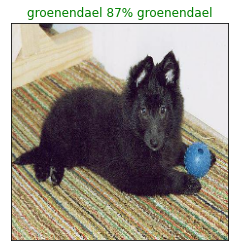

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)


Now we've got one function to visualize our model top prediction, let's make another to view our models top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
       * Prediction probabilities indexes
       * Prediction probabilities values
       * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green 
    

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n):
  """
  Plus th e top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 predictio confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # find the top 10 predicition labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                      top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             top_10_pred_values,
             color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

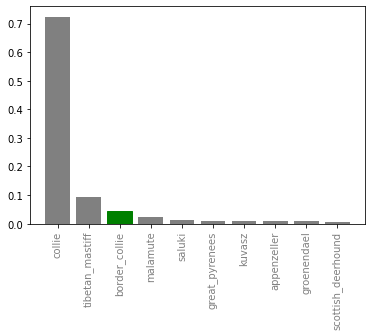

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our modle,let's check out a few.

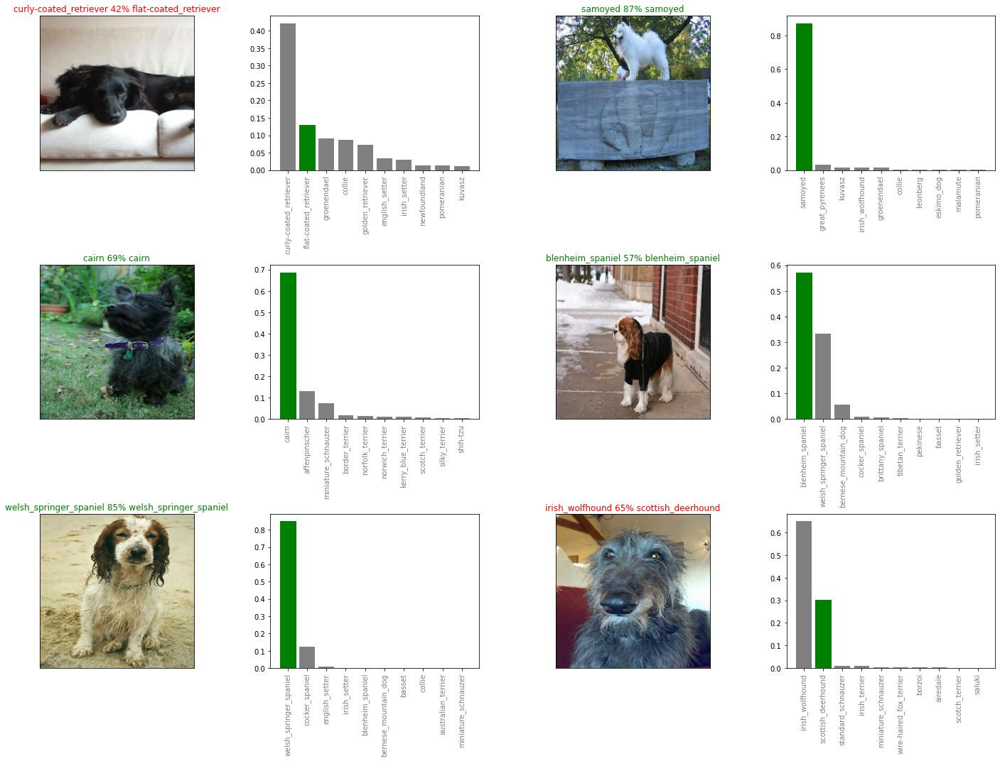

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our models prredictions and true labels?

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model 
def save_model(model, suffixe=None):
  """
  Saves a given model in models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffixe + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model form: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffixe="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20221001-16341664642091-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20221001-16341664642091-1000-images-mobilenetv2-Adam.h5'

In [ ]:
#  Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dog Vision/models/20220930-20401664570403-1000-images-mobilenetv2-Adam.h5')

Loading saved model form: /content/drive/MyDrive/Dog Vision/models/20220930-20401664570403-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluating the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 9s 1s/step - loss: 1.2334 - accuracy: 0.6900


[1.2334446907043457, 0.6899999976158142]

In [ ]:
# Evaluating the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 11s 1s/step - loss: 1.2447 - accuracy: 0.6700


[1.244704008102417, 0.6700000166893005]

## Training a big model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X,y)

Creating training batches ...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 413s 1s/step - loss: 1.3337 - accuracy: 0.6686
Epoch 2/100
320/320 [==============================] - 408s 1s/step - loss: 0.4013 - accuracy: 0.8789
Epoch 3/100
320/320 [==============================] - 412s 1s/step - loss: 0.2388 - accuracy: 0.9315
Epoch 4/100
320/320 [==============================] - 415s 1s/step - loss: 0.1567 - accuracy: 0.9596
Epoch 5/100
320/320 [==============================] - 416s 1s/step - loss: 0.1031 - accuracy: 0.9786
Epoch 6/100
320/320 [==============================] - 415s 1s/step - loss: 0.0773 - accuracy: 0.9867
Epoch 7/100
320/320 [==============================] - 417s 1s/step - loss: 0.0579 - accuracy: 0.9919
Epoch 8/100
320/320 [==============================] - 416s 1s/step - loss: 0.0475 - accuracy: 0.9939
Epoch 9/100
320/320 [==============================] - 415s 1s/step - loss: 0.0376 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 414s 1s/step - loss: 0.031

In [ ]:
save_model(full_model, suffixe="full-image-set-mobelenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20221001-18471664650039-full-image-set-mobelenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20221001-18471664650039-full-image-set-mobelenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/Dog Vision/models/20220930-20401664570403-1000-images-mobilenetv2-Adam.h5')

Loading saved model form: /content/drive/MyDrive/Dog Vision/models/20220930-20401664570403-1000-images-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor barches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model. 

In [ ]:
# Load test image filenames
test_path ="/content/drive/MyDrive/projet/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/projet/test/e46a2bfb7816324d171c4e07786abc59.jpg',
 '/content/drive/MyDrive/projet/test/def9a16cb97a7cdd10d6465d642f6bf4.jpg',
 '/content/drive/MyDrive/projet/test/e000b7b3b37659a771d0151dc453bc0a.jpg',
 '/content/drive/MyDrive/projet/test/dd9d222a481e6cbea922a1b601a55a38.jpg',
 '/content/drive/MyDrive/projet/test/e1444b7c629f6775432269bfd9c7e758.jpg',
 '/content/drive/MyDrive/projet/test/e12731c30619c3fa4b0d9d9a76fb9d60.jpg',
 '/content/drive/MyDrive/projet/test/dcb5d319bd013bbfa9779d8c6c11a829.jpg',
 '/content/drive/MyDrive/projet/test/e3982348ad8b974cef2298f741bc3c99.jpg',
 '/content/drive/MyDrive/projet/test/dd2228d2fbb3ddc8fb350106c2d989ef.jpg',
 '/content/drive/MyDrive/projet/test/e18a9e69da19fc1a19885d15b7f26e92.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note**: Calling `predict()` on our model and passing it the test data batch will take a long time to run (about an ~ 1hr)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 732s 2s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv",test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog Vision/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[2.45312040e-05, 8.62494344e-05, 1.49441941e-04, ...,
        1.94903195e-03, 1.81619693e-02, 1.57088289e-04],
       [6.72706155e-05, 3.25785135e-04, 1.47751300e-04, ...,
        2.13610489e-04, 7.31462496e-05, 1.18517608e-03],
       [2.45091724e-05, 5.06354490e-06, 5.27718794e-06, ...,
        1.97345453e-05, 3.79581024e-06, 8.37035350e-06],
       ...,
       [6.53935931e-05, 9.02046886e-05, 1.92361162e-03, ...,
        2.11675899e-04, 5.69029980e-05, 9.89812725e-06],
       [9.49944463e-03, 1.17832918e-04, 1.89272265e-04, ...,
        9.34384225e-05, 4.04220831e-04, 4.19879556e-02],
       [1.36532856e-03, 9.02194370e-05, 2.75402068e-04, ...,
        3.99862678e-04, 3.47387831e-04, 3.74342693e-04]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Lookking at the Kaggle sample submission, we find that it wants our models prediction probabibility outputs on a Dataframe with an ID and a clumn for each different dog breed.
https://www.kaggle.com/competitions/dog-breed-identification

To get the data in this format, we'll:
* Create a padas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's drom their filepaths.
* Add data (the prediction probabilities) tp each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle. 

In [ ]:
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [ ]:
 #["id"] + list(unique_breeds)

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path) for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,"(e46a2bfb7816324d171c4e07786abc59, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"(def9a16cb97a7cdd10d6465d642f6bf4, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"(e000b7b3b37659a771d0151dc453bc0a, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"(dd9d222a481e6cbea922a1b601a55a38, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"(e1444b7c629f6775432269bfd9c7e758, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,"(e46a2bfb7816324d171c4e07786abc59, .jpg)",0.000025,0.000086,0.000149,0.003719,0.000066,0.001860,0.000452,0.000127,0.000053,...,0.006969,0.000333,0.000028,0.000177,0.000534,0.000006,0.000064,0.001949,0.018162,0.000157
1,"(def9a16cb97a7cdd10d6465d642f6bf4, .jpg)",0.000067,0.000326,0.000148,0.000517,0.000045,0.001928,0.011461,0.002009,0.000089,...,0.000129,0.003849,0.000113,0.000077,0.000075,0.000057,0.000047,0.000214,0.000073,0.001185
2,"(e000b7b3b37659a771d0151dc453bc0a, .jpg)",0.000025,0.000005,0.000005,0.000003,0.000055,0.000061,0.000222,0.000166,0.000027,...,0.000012,0.000035,0.001250,0.001840,0.000112,0.000004,0.000001,0.000020,0.000004,0.000008
3,"(dd9d222a481e6cbea922a1b601a55a38, .jpg)",0.000086,0.000453,0.000547,0.000030,0.000132,0.010744,0.000089,0.000732,0.000057,...,0.000271,0.000023,0.000126,0.000210,0.000088,0.000009,0.000560,0.000354,0.000755,0.000143
4,"(e1444b7c629f6775432269bfd9c7e758, .jpg)",0.000083,0.000014,0.000033,0.000037,0.001419,0.032209,0.000014,0.000203,0.002689,...,0.000151,0.000146,0.000037,0.000499,0.000022,0.000128,0.000097,0.000119,0.000024,0.000022


In [ ]:
# Save our predictions dataFrame to CSV for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`.And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.



In [ ]:
# Get custom omage filepaths
custom_path = "/content/drive/MyDrive/Dog Vision/my images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/my images/dog.jpg',
 '/content/drive/MyDrive/Dog Vision/my images/vetstreet.brightspotcdn.jpg',
 '/content/drive/MyDrive/Dog Vision/my images/haskey.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Mke predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['walker_hound', 'vizsla', 'siberian_husky']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

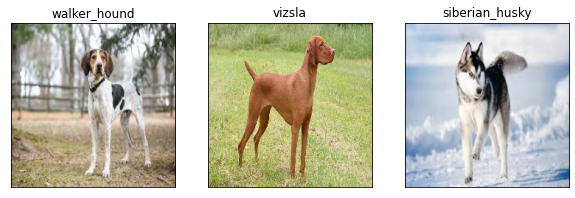

In [ ]:
# image custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)
